In [1]:
import requests
x = requests.get('https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt') 
# The x outputs are stored in a text file in my home directory

## Problem 0

In [49]:
import torch
import torchvision.models as models
from torchvision import transforms
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Loading ResNet50
resnet = models.resnet50(pretrained=True)
resnet.eval()  # Set the model to evaluation mode

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

image = Image.open('leahy-cat1.png')
image = transform(image).unsqueeze(0)  # Add batch dimension

with torch.no_grad():
    outputs = resnet(image)

_, indices = torch.topk(outputs, 5)
probabilities = torch.nn.functional.softmax(outputs, dim=1)[0] * 100

with open('imagenet_classes.txt',) as f:
    classes = [line.strip() for line in f.readlines()]

for i in range(5):
    print(f"Predicted class: {classes[indices[0][i]]}, Probability: {probabilities[indices[0][i]].item():.2f}%")

Predicted class: Egyptian cat, Probability: 32.50%
Predicted class: tabby, Probability: 12.67%
Predicted class: tiger cat, Probability: 6.16%
Predicted class: bath towel, Probability: 6.15%
Predicted class: paper towel, Probability: 5.22%


### The resnet50 algorithm has predicted our cat as an egyptian cat with an accuracy of 32.5%.

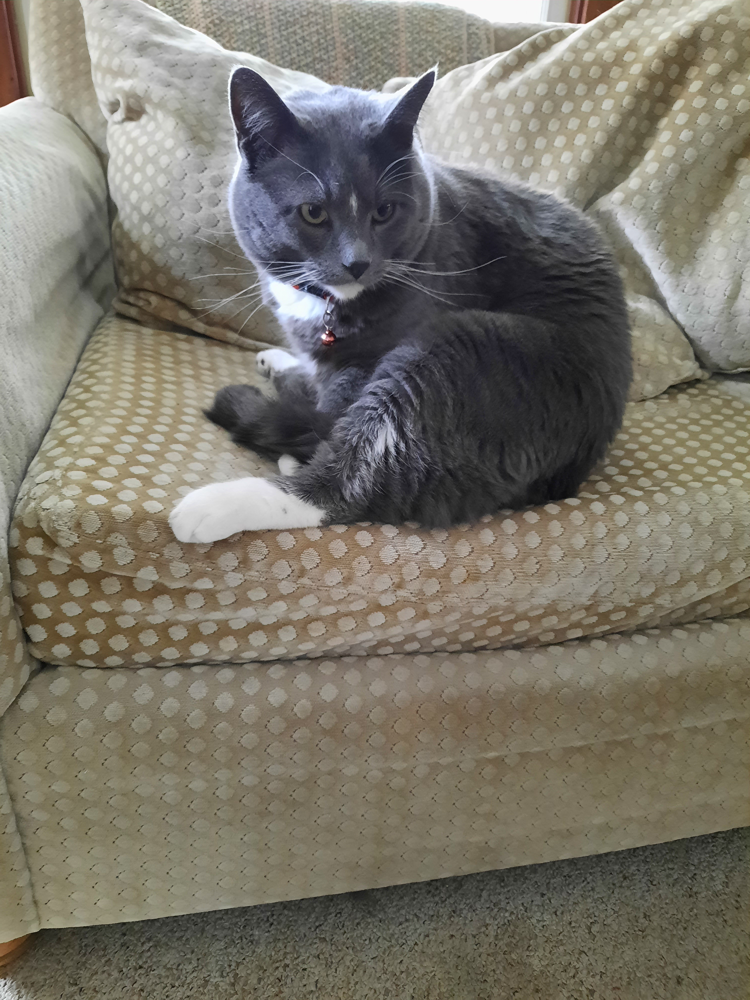

In [3]:
image = Image.open('leahy-cat1.png')
image

### Problem 1

In [51]:
import torchvision 
from torchvision import transforms 
image_path = './'
transform = transforms.Compose([transforms.ToTensor()])

mnist_dataset = torchvision.datasets.MNIST(root=image_path, 
                                           train=True, 
                                           transform=transform, 
                                           download=True)

from torch.utils.data import Subset
mnist_valid_dataset = Subset(mnist_dataset, torch.arange(10000)) 
mnist_train_dataset = Subset(mnist_dataset, torch.arange(10000, len(mnist_dataset)))
mnist_test_dataset = torchvision.datasets.MNIST(root=image_path, 
                                           train=False, 
                                           transform=transform, 
                                           download=False)

In [52]:
from torch.utils.data import DataLoader


batch_size = 64
torch.manual_seed(1)
train_dl = DataLoader(mnist_train_dataset, batch_size, shuffle=True)
valid_dl = DataLoader(mnist_valid_dataset, batch_size, shuffle=False)

In [53]:
import torch.nn as nn

model = nn.Sequential()
model.add_module('conv1', nn.Conv2d(in_channels=1, out_channels=16, kernel_size=5,stride=3, padding=2))
model.add_module('relu1', nn.ReLU())        
model.add_module('pool1', nn.AvgPool2d(kernel_size=2))   
model.add_module('conv2', nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1,padding=1))
model.add_module('relu2', nn.ReLU())        
model.add_module('pool2', nn.AvgPool2d(kernel_size=2))      

x = torch.ones((4, 1, 28, 28))
model(x).shape

torch.Size([4, 32, 2, 2])

In [54]:
model.add_module('flatten', nn.Flatten()) 

x = torch.ones((1, 1, 28, 28))
model(x).shape


torch.Size([1, 128])

In [55]:
from torch.utils.data import DataLoader


batch_size = 64
torch.manual_seed(1)
train_dl = DataLoader(mnist_train_dataset, batch_size, shuffle=True)
valid_dl = DataLoader(mnist_valid_dataset, batch_size, shuffle=False)

### Drop out probability of 0.5

In [56]:
model.add_module('fc1', nn.Linear(128, 512)) 
model.add_module('relu3', nn.ReLU()) 
model.add_module('dropout', nn.Dropout(p=0.5)) 
model.add_module('fc2', nn.Linear(512, 10)) 

In [57]:
device = torch.device("cuda:0")
# device = torch.device("cpu")
model = model.to(device) 

## Printing validation accuracy and test data accuracy

In [14]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train(model, num_epochs, train_dl, valid_dl):
    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs
    for epoch in range(num_epochs):
        model.train()
        for x_batch, y_batch in train_dl:
            x_batch = x_batch.to(device) 
            y_batch = y_batch.to(device) 
            pred = model(x_batch)
            loss = loss_fn(pred, y_batch)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_hist_train[epoch] += loss.item()*y_batch.size(0)
            is_correct = (torch.argmax(pred, dim=1) == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().cpu()

        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        
        model.eval()
        with torch.no_grad():
            for x_batch, y_batch in valid_dl:
                x_batch = x_batch.to(device) 
                y_batch = y_batch.to(device) 
                pred = model(x_batch)
                loss = loss_fn(pred, y_batch)
                loss_hist_valid[epoch] += loss.item()*y_batch.size(0) 
                is_correct = (torch.argmax(pred, dim=1) == y_batch).float() 
                accuracy_hist_valid[epoch] += is_correct.sum().cpu()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)
        
        print(f'Epoch {epoch+1} accuracy: {accuracy_hist_train[epoch]:.4f} val_accuracy: {accuracy_hist_valid[epoch]:.4f}')
    return loss_hist_train, loss_hist_valid, accuracy_hist_train, accuracy_hist_valid

torch.manual_seed(1)
num_epochs = 20
hist = train(model, num_epochs, train_dl, valid_dl)

Epoch 1 accuracy: 0.7647 val_accuracy: 0.9176
Epoch 2 accuracy: 0.9275 val_accuracy: 0.9447
Epoch 3 accuracy: 0.9477 val_accuracy: 0.9582
Epoch 4 accuracy: 0.9573 val_accuracy: 0.9648
Epoch 5 accuracy: 0.9636 val_accuracy: 0.9674
Epoch 6 accuracy: 0.9669 val_accuracy: 0.9694
Epoch 7 accuracy: 0.9695 val_accuracy: 0.9759
Epoch 8 accuracy: 0.9723 val_accuracy: 0.9762
Epoch 9 accuracy: 0.9739 val_accuracy: 0.9782
Epoch 10 accuracy: 0.9759 val_accuracy: 0.9804
Epoch 11 accuracy: 0.9782 val_accuracy: 0.9806
Epoch 12 accuracy: 0.9795 val_accuracy: 0.9784
Epoch 13 accuracy: 0.9809 val_accuracy: 0.9816
Epoch 14 accuracy: 0.9816 val_accuracy: 0.9818
Epoch 15 accuracy: 0.9832 val_accuracy: 0.9831
Epoch 16 accuracy: 0.9842 val_accuracy: 0.9822
Epoch 17 accuracy: 0.9846 val_accuracy: 0.9819
Epoch 18 accuracy: 0.9855 val_accuracy: 0.9833
Epoch 19 accuracy: 0.9862 val_accuracy: 0.9832
Epoch 20 accuracy: 0.9876 val_accuracy: 0.9836


In [58]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train(model, num_epochs, train_dl, valid_dl):
    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs
    for epoch in range(num_epochs):
        model.train()
        for x_batch, y_batch in train_dl:
            x_batch = x_batch.to(device) 
            y_batch = y_batch.to(device) 
            pred = model(x_batch)
            loss = loss_fn(pred, y_batch)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_hist_train[epoch] += loss.item()*y_batch.size(0)
            is_correct = (torch.argmax(pred, dim=1) == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().cpu()

        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        
        model.eval()
        with torch.no_grad():
            for x_batch, y_batch in valid_dl:
                x_batch = x_batch.to(device) 
                y_batch = y_batch.to(device) 
                pred = model(x_batch)
                loss = loss_fn(pred, y_batch)
                loss_hist_valid[epoch] += loss.item()*y_batch.size(0) 
                is_correct = (torch.argmax(pred, dim=1) == y_batch).float() 
                accuracy_hist_valid[epoch] += is_correct.sum().cpu()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)
        
        print(f'Epoch {epoch+1} accuracy: {accuracy_hist_train[epoch]:.4f} val_accuracy: {accuracy_hist_valid[epoch]:.4f}')
    return loss_hist_train, loss_hist_valid, accuracy_hist_train, accuracy_hist_valid

torch.manual_seed(1)
num_epochs = 20
hist = train(model, num_epochs, train_dl, valid_dl)

Epoch 1 accuracy: 0.7644 val_accuracy: 0.9175
Epoch 2 accuracy: 0.9262 val_accuracy: 0.9430
Epoch 3 accuracy: 0.9476 val_accuracy: 0.9560
Epoch 4 accuracy: 0.9569 val_accuracy: 0.9646
Epoch 5 accuracy: 0.9635 val_accuracy: 0.9664
Epoch 6 accuracy: 0.9668 val_accuracy: 0.9688
Epoch 7 accuracy: 0.9692 val_accuracy: 0.9754
Epoch 8 accuracy: 0.9721 val_accuracy: 0.9762
Epoch 9 accuracy: 0.9739 val_accuracy: 0.9797
Epoch 10 accuracy: 0.9763 val_accuracy: 0.9799
Epoch 11 accuracy: 0.9779 val_accuracy: 0.9803
Epoch 12 accuracy: 0.9789 val_accuracy: 0.9788
Epoch 13 accuracy: 0.9808 val_accuracy: 0.9824
Epoch 14 accuracy: 0.9813 val_accuracy: 0.9816
Epoch 15 accuracy: 0.9838 val_accuracy: 0.9823
Epoch 16 accuracy: 0.9840 val_accuracy: 0.9822
Epoch 17 accuracy: 0.9845 val_accuracy: 0.9812
Epoch 18 accuracy: 0.9859 val_accuracy: 0.9840
Epoch 19 accuracy: 0.9859 val_accuracy: 0.9832
Epoch 20 accuracy: 0.9874 val_accuracy: 0.9840


### Prediciting the accuracy score of the model on the mnist test dataset

In [70]:
torch.cuda.synchronize()
model_cpu = model.cpu()
pred = model(mnist_test_dataset.data.unsqueeze(1) / 255.)
is_correct = (torch.argmax(pred, dim=1) == mnist_test_dataset.targets).float()
print(f'Test accuracy: {is_correct.mean():.4f}') 

Test accuracy: 0.9859


### Random plot of 12 images for the Mnistdataset

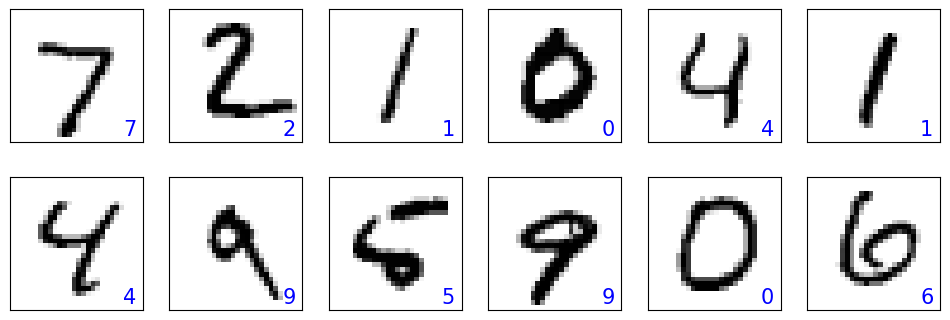

In [74]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(12, 4))
for i in range(12):
    ax = fig.add_subplot(2, 6, i+1)
    ax.set_xticks([]); ax.set_yticks([])
    img = mnist_test_dataset[i][0][0, :, :]
    pred = model(img.unsqueeze(0).unsqueeze(1))
    y_pred = torch.argmax(pred)
    ax.imshow(img, cmap='gray_r')
    ax.text(0.9, 0.1, y_pred.item(), 
            size=15, color='blue',
            horizontalalignment='center',
            verticalalignment='center', 
            transform=ax.transAxes)
    
    
#plt.savefig('figures/14_14.png')
plt.show()


### Problem 1 part a)

### Produce a plot of a random sample of 10 elements of the newly transformed dataset

In [60]:
import torchvision.transforms as transforms
rotation_transform = transforms.Compose([
    transforms.RandomRotation((60,60)),
    #transforms.CenterCrop(224),
    #transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [25]:
#rotation_transform = transforms.RandomRotation((60,60))

In [61]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import random

rand_indices = random.sample(range(len(mnist_train_dataset)),10)

sample_imgs = []
for i in rand_indices:
    sample_imgs.append(mnist_train_dataset[i][0])
rotated_imgs =[rotation_transform(image) for image in sample_imgs]

## Plot of 10 random affine rotational images

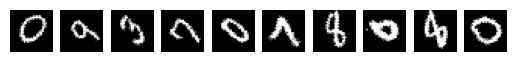

In [27]:
fig,axes = plt.subplots(1,len(rotated_imgs))
for i in range(len(rotated_imgs)):
    axes[i].imshow(rotated_imgs[i].squeeze(),cmap='grey')
    axes[i].axis('off')
plt.show()

### Find the accuracy score of your model on this new dataset. Does rotating the data seem to have an impact on your accuracy?

In [64]:
import torchvision 
from torchvision import transforms 
image_path = './'
#transform = transforms.Compose([transforms.ToTensor()])

mnist_dataset2 = torchvision.datasets.MNIST(root=image_path, 
                                           train=True, 
                                           transform=rotation_transform, 
                                           download=True)

In [29]:
device = torch.device("cuda:0")
# device = torch.device("cpu")
model = model.to(device) 

### Accuracy of rotational transformation

In [65]:
torch.cuda.synchronize()
model_cpu = model.cpu()
pred = model(mnist_dataset2.data.unsqueeze(1) / 255.)
is_correct = (torch.argmax(pred, dim=1) == mnist_dataset2.targets).float()
print(f'Test accuracy: {is_correct.mean():.4f}') 

Test accuracy: 0.9917


## Affine transformation

In [66]:
shear_transform = transforms.Compose([
    transforms.RandomAffine((60,60),translate=(0,0.3),shear=(0,30)),
    #transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [67]:
import torchvision 
from torchvision import transforms 
image_path = './'
mnist_dataset3 = torchvision.datasets.MNIST(root=image_path, 
                                           train=True, 
                                           transform=shear_transform, 
                                           download=True)


In [68]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import random

rand_indices = random.sample(range(len(mnist_train_dataset)),10)

sample_imgs = []
for i in rand_indices:
    sample_imgs.append(mnist_dataset3[i][0])


## Plot of 10 random affine transformation images

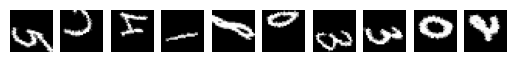

In [34]:
fig,axes = plt.subplots(1,len(sample_imgs))
for i in range(len(sample_imgs)):
    axes[i].imshow(sample_imgs[i].squeeze(),cmap='grey')
    axes[i].axis('off')
plt.show()

### Accuracy of Affine transformation

In [69]:
torch.cuda.synchronize()
model_cpu = model.cpu()
pred = model(mnist_dataset3.data.unsqueeze(1) / 255.)
is_correct = (torch.argmax(pred, dim=1) == mnist_dataset3.targets).float()
print(f'Test accuracy: {is_correct.mean():.4f}') 

Test accuracy: 0.9917


In [38]:
import torch
import torch.nn as nn
import numpy as np

from IPython.display import Image

import matplotlib.pyplot as plt
%matplotlib inline

### Problem 2

In [24]:
import torchvision 
image_path = '/data'
celeba_train_dataset = torchvision.datasets.CelebA(image_path, split='train', target_type='attr', download=False)
celeba_valid_dataset = torchvision.datasets.CelebA(image_path, split='valid', target_type='attr', download=False)
celeba_test_dataset = torchvision.datasets.CelebA(image_path, split='test', target_type='attr', download=False)

print('Train set:', len(celeba_train_dataset))
print('Validation set:', len(celeba_valid_dataset))
print('Test set:', len(celeba_test_dataset))

Train set: 162770
Validation set: 19867
Test set: 19962


In [25]:
with open('/data/celeba/list_attr_celeba.txt') as f:

    first_line = f.readline()
    second_line = f.readline()
    myattributes = second_line.split()

In [26]:
myattributes

['5_o_Clock_Shadow',
 'Arched_Eyebrows',
 'Attractive',
 'Bags_Under_Eyes',
 'Bald',
 'Bangs',
 'Big_Lips',
 'Big_Nose',
 'Black_Hair',
 'Blond_Hair',
 'Blurry',
 'Brown_Hair',
 'Bushy_Eyebrows',
 'Chubby',
 'Double_Chin',
 'Eyeglasses',
 'Goatee',
 'Gray_Hair',
 'Heavy_Makeup',
 'High_Cheekbones',
 'Male',
 'Mouth_Slightly_Open',
 'Mustache',
 'Narrow_Eyes',
 'No_Beard',
 'Oval_Face',
 'Pale_Skin',
 'Pointy_Nose',
 'Receding_Hairline',
 'Rosy_Cheeks',
 'Sideburns',
 'Smiling',
 'Straight_Hair',
 'Wavy_Hair',
 'Wearing_Earrings',
 'Wearing_Hat',
 'Wearing_Lipstick',
 'Wearing_Necklace',
 'Wearing_Necktie',
 'Young']

In [34]:
from torchvision import transforms 
from torchvision import transforms 

get_smile = lambda attr: attr[31]
 
transform_train = transforms.Compose([
    transforms.RandomCrop([178, 178]),
    transforms.RandomHorizontalFlip(),
    transforms.Resize([64, 64]),
    transforms.ToTensor(),
])

transform = transforms.Compose([
    transforms.CenterCrop([178, 178]),
    transforms.Resize([64, 64]),
    transforms.ToTensor(),
])

In [35]:
from torch.utils.data import DataLoader

celeba_train_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='train', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform_train,
                                                   target_transform=get_smile)

torch.manual_seed(1)
data_loader = DataLoader(celeba_train_dataset, batch_size=32)

In [36]:
celeba_valid_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='valid', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform,
                                                   target_transform=get_smile)

celeba_test_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='test', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform,
                                                   target_transform=get_smile)

from torch.utils.data import Subset
celeba_train_dataset = Subset(celeba_train_dataset, torch.arange(162770)) 
celeba_valid_dataset = Subset(celeba_valid_dataset, torch.arange(19867)) 
 
print('Train set:', len(celeba_train_dataset))
print('Validation set:', len(celeba_valid_dataset))


Train set: 162770
Validation set: 19867


In [37]:
import torch.nn as nn

model = nn.Sequential()

model.add_module('conv1', nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1))
model.add_module('relu1', nn.ReLU())        
model.add_module('pool1', nn.MaxPool2d(kernel_size=2))  
model.add_module('dropout1', nn.Dropout(p=0.5)) 

model.add_module('conv2', nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1))
model.add_module('relu2', nn.ReLU())        
model.add_module('pool2', nn.MaxPool2d(kernel_size=2))   
model.add_module('dropout2', nn.Dropout(p=0.5)) 

model.add_module('conv3', nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1))
model.add_module('relu3', nn.ReLU())        
model.add_module('pool3', nn.MaxPool2d(kernel_size=2))   

model.add_module('conv4', nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1))
model.add_module('relu4', nn.ReLU())  

x = torch.ones((4, 3, 64, 64))
model(x).shape

model.add_module('pool4', nn.AvgPool2d(kernel_size=8)) 
model.add_module('flatten', nn.Flatten()) 

x = torch.ones((4, 3, 64, 64))
model(x).shape

model.add_module('fc', nn.Linear(256, 1)) 
model.add_module('sigmoid', nn.Sigmoid()) 

x = torch.ones((4, 3, 64, 64))
model(x).shape


torch.Size([4, 1])

In [38]:
batch_size = 32

torch.manual_seed(1)
train_dl = DataLoader(celeba_train_dataset,batch_size, shuffle=True)
valid_dl = DataLoader(celeba_valid_dataset, batch_size, shuffle=False)
test_dl = DataLoader(celeba_test_dataset, batch_size, shuffle=False)

In [39]:
device = torch.device("cuda:0")
# device = torch.device("cpu")
model = model.to(device) 

In [40]:
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train(model, num_epochs, train_dl, valid_dl):
    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs
    for epoch in range(num_epochs):
        model.train()
        for x_batch, y_batch in train_dl:
            x_batch = x_batch.to(device) 
            y_batch = y_batch.to(device) 
            pred = model(x_batch)[:, 0]
            loss = loss_fn(pred, y_batch.float())
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_hist_train[epoch] += loss.item()*y_batch.size(0)
            is_correct = ((pred>=0.5).float() == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().cpu()

        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        
        model.eval()
        with torch.no_grad():
            for x_batch, y_batch in valid_dl:
                x_batch = x_batch.to(device) 
                y_batch = y_batch.to(device) 
                pred = model(x_batch)[:, 0]
                loss = loss_fn(pred, y_batch.float())
                loss_hist_valid[epoch] += loss.item()*y_batch.size(0) 
                is_correct = ((pred>=0.5).float() == y_batch).float()
                accuracy_hist_valid[epoch] += is_correct.sum().cpu()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)
        
        print(f'Epoch {epoch+1} accuracy: {accuracy_hist_train[epoch]:.4f} val_accuracy: {accuracy_hist_valid[epoch]:.4f}')
    return loss_hist_train, loss_hist_valid, accuracy_hist_train, accuracy_hist_valid

torch.manual_seed(1)
num_epochs = 30
hist = train(model, num_epochs, train_dl, valid_dl)

Epoch 1 accuracy: 0.6379 val_accuracy: 0.7794
Epoch 2 accuracy: 0.8182 val_accuracy: 0.8960
Epoch 3 accuracy: 0.8722 val_accuracy: 0.9093
Epoch 4 accuracy: 0.8868 val_accuracy: 0.9103
Epoch 5 accuracy: 0.8923 val_accuracy: 0.9151
Epoch 6 accuracy: 0.8956 val_accuracy: 0.9127
Epoch 7 accuracy: 0.8993 val_accuracy: 0.9162
Epoch 8 accuracy: 0.8999 val_accuracy: 0.9183
Epoch 9 accuracy: 0.9019 val_accuracy: 0.9133
Epoch 10 accuracy: 0.9039 val_accuracy: 0.9156
Epoch 11 accuracy: 0.9042 val_accuracy: 0.9200
Epoch 12 accuracy: 0.9050 val_accuracy: 0.9164
Epoch 13 accuracy: 0.9058 val_accuracy: 0.9221
Epoch 14 accuracy: 0.9066 val_accuracy: 0.9203
Epoch 15 accuracy: 0.9074 val_accuracy: 0.9206
Epoch 16 accuracy: 0.9083 val_accuracy: 0.9197
Epoch 17 accuracy: 0.9079 val_accuracy: 0.9237
Epoch 18 accuracy: 0.9080 val_accuracy: 0.9216
Epoch 19 accuracy: 0.9085 val_accuracy: 0.9214
Epoch 20 accuracy: 0.9084 val_accuracy: 0.9226
Epoch 21 accuracy: 0.9098 val_accuracy: 0.9237
Epoch 22 accuracy: 0.9

### Accuracy Test

In [44]:
accuracy_test = 0

model.eval()
with torch.no_grad():
    for x_batch, y_batch in test_dl:
        x_batch = x_batch.to(device) 
        y_batch = y_batch.to(device) 
        pred = model(x_batch)[:, 0]
        is_correct = ((pred>=0.5).float() == y_batch).float()
        accuracy_test += is_correct.sum().cpu()
 
accuracy_test /= len(test_dl.dataset)
        
print(f'Test accuracy: {accuracy_test:.4f}')

Test accuracy: 0.9204


### Plotting Accuracy of valid test data and train test dataset

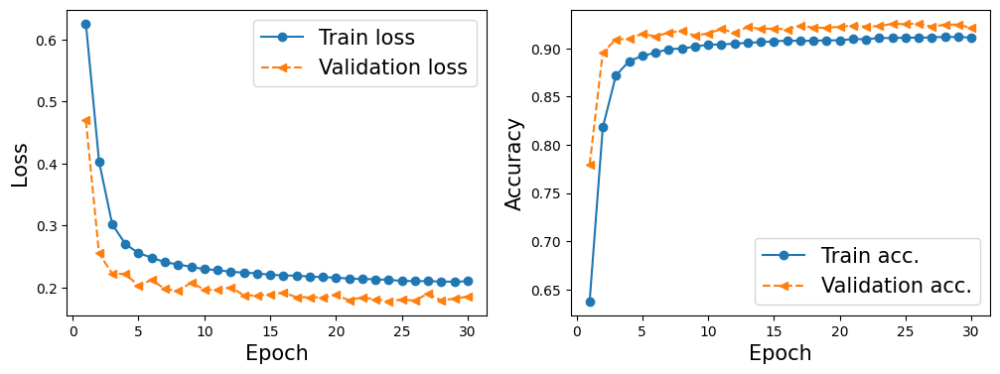

In [46]:
import numpy as np
import matplotlib.pyplot as plt
x_arr = np.arange(len(hist[0])) + 1

fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(1, 2, 1)
ax.plot(x_arr, hist[0], '-o', label='Train loss')
ax.plot(x_arr, hist[1], '--<', label='Validation loss')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Loss', size=15)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x_arr, hist[2], '-o', label='Train acc.')
ax.plot(x_arr, hist[3], '--<', label='Validation acc.')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Accuracy', size=15)

#plt.savefig('figures/14_17.png', dpi=300)
plt.show()

### Random plot of 10 images of model's prediction

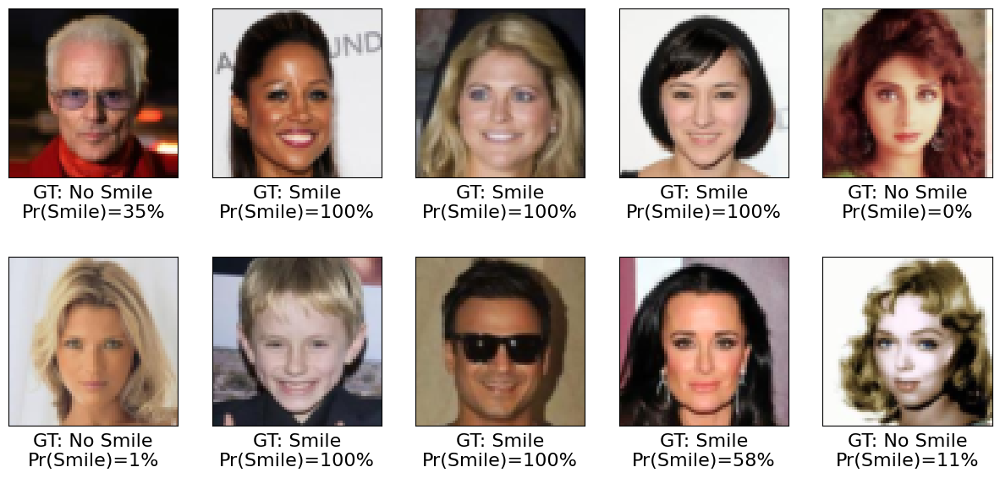

In [47]:
pred = model(x_batch)[:, 0] * 100

fig = plt.figure(figsize=(15, 7))
for j in range(16, 26):
    ax = fig.add_subplot(2, 5, j-16+1)
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(x_batch[j].cpu().permute(1, 2, 0))
    if y_batch[j] == 1:
        label = 'Smile'
    else:
        label = 'No Smile'
    ax.text(
        0.5, -0.15, 
        f'GT: {label:s}\nPr(Smile)={pred[j]:.0f}%', 
        size=16, 
        horizontalalignment='center',
        verticalalignment='center', 
        transform=ax.transAxes)
    
#plt.savefig('figures/figures-14_18.png', dpi=300)
plt.show()

## Problem 3

In [3]:
with open('/data/celeba/list_attr_celeba.txt') as f:

    first_line = f.readline()
    second_line = f.readline()
    myattributes = second_line.split()

In [4]:
from torchvision import transforms 
from torchvision import transforms
get_eyeglasses = lambda attr: attr[15]
 
transform_train = transforms.Compose([
    transforms.RandomCrop([178, 178]),
    transforms.RandomHorizontalFlip(),
    transforms.Resize([64, 64]),
    transforms.ToTensor(),
])

transform = transforms.Compose([
    transforms.CenterCrop([178, 178]),
    transforms.Resize([64, 64]),
    transforms.ToTensor(),
])

In [ ]:
from torch.utils.data import DataLoader

celeba_train_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='train', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform_train,
                                                   target_transform=get_smile)

torch.manual_seed(1)
data_loader = DataLoader(celeba_train_dataset, batch_size=32)

In [9]:
from torch.utils.data import DataLoader
import torchvision
image_path='/data'
celeba_valid_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='valid', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform,
                                                   target_transform=get_eyeglasses)

celeba_test_dataset = torchvision.datasets.CelebA(image_path, 
                                                   split='test', 
                                                   target_type='attr', 
                                                   download=False, 
                                                   transform=transform,
                                                   target_transform=get_eyeglasses)
image_path = '/data'
celeba_train_dataset = torchvision.datasets.CelebA(image_path, split='train', target_type='attr', download=False)
celeba_valid_dataset = torchvision.datasets.CelebA(image_path, split='valid', target_type='attr', download=False)
celeba_test_dataset = torchvision.datasets.CelebA(image_path, split='test', target_type='attr', download=False)


from torch.utils.data import Subset
celeba_train_dataset = Subset(celeba_train_dataset, torch.arange(162770)) 
celeba_valid_dataset = Subset(celeba_valid_dataset, torch.arange(19867)) 
 
print('Train set:', len(celeba_train_dataset))
print('Validation set:', len(celeba_valid_dataset))


Train set: 162770
Validation set: 19867


In [10]:
import torch.nn as nn

model = nn.Sequential()

model.add_module('conv1', nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1))
model.add_module('relu1', nn.ReLU())        
model.add_module('pool1', nn.AvgPool2d(kernel_size=2))  
model.add_module('dropout1', nn.Dropout(p=0.2)) 

model.add_module('conv2', nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1))
model.add_module('relu2', nn.ReLU())        
model.add_module('pool2', nn.AvgPool2d(kernel_size=2))   
model.add_module('dropout2', nn.Dropout(p=0.2)) 

model.add_module('conv3', nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1))
model.add_module('relu3', nn.ReLU())        
model.add_module('pool3', nn.AvgPool2d(kernel_size=2))   

model.add_module('conv4', nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1))
model.add_module('relu4', nn.ReLU())  

model.add_module('pool4', nn.AvgPool2d(kernel_size=8)) 
model.add_module('flatten', nn.Flatten()) 

model.add_module('fc', nn.Linear(256, 1)) 
model.add_module('sigmoid', nn.Sigmoid()) 

x = torch.ones((4, 3, 64, 64))
model(x).shape


torch.Size([4, 1])

In [11]:
import torch
batch_size = 32

torch.manual_seed(1)
train_dl = DataLoader(celeba_train_dataset, batch_size, shuffle=True)
valid_dl = DataLoader(celeba_valid_dataset, batch_size, shuffle=False)
test_dl = DataLoader(celeba_test_dataset, batch_size, shuffle=False)

In [12]:
device = torch.device("cuda:0")
# device = torch.device("cpu")
model = model.to(device) 

In [39]:
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train(model, num_epochs, train_dl, valid_dl):
    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs
    for epoch in range(num_epochs):
        model.train()
        for x_batch, y_batch in train_dl:
            x_batch = x_batch.to(device) 
            y_batch = y_batch.to(device) 
            pred = model(x_batch)[:, 0]
            loss = loss_fn(pred, y_batch.float())
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_hist_train[epoch] += loss.item()*y_batch.size(0)
            is_correct = ((pred>=0.5).float() == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().cpu()

        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        
        model.eval()
        with torch.no_grad():
            for x_batch, y_batch in valid_dl:
                x_batch = x_batch.to(device) 
                y_batch = y_batch.to(device) 
                pred = model(x_batch)[:, 0]
                loss = loss_fn(pred, y_batch.float())
                loss_hist_valid[epoch] += loss.item()*y_batch.size(0) 
                is_correct = ((pred>=0.5).float() == y_batch).float()
                accuracy_hist_valid[epoch] += is_correct.sum().cpu()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)
        
        print(f'Epoch {epoch+1} accuracy: {accuracy_hist_train[epoch]:.4f} val_accuracy: {accuracy_hist_valid[epoch]:.4f}')
    return loss_hist_train, loss_hist_valid, accuracy_hist_train, accuracy_hist_valid

torch.manual_seed(1)
num_epochs = 30
hist = train(model, num_epochs, train_dl, valid_dl)

Epoch 1 accuracy: 0.9388 val_accuracy: 0.9469
Epoch 2 accuracy: 0.9602 val_accuracy: 0.9697
Epoch 3 accuracy: 0.9712 val_accuracy: 0.9775
Epoch 4 accuracy: 0.9769 val_accuracy: 0.9817
Epoch 5 accuracy: 0.9806 val_accuracy: 0.9857
Epoch 6 accuracy: 0.9825 val_accuracy: 0.9874
Epoch 7 accuracy: 0.9842 val_accuracy: 0.9839
Epoch 8 accuracy: 0.9859 val_accuracy: 0.9886
Epoch 9 accuracy: 0.9870 val_accuracy: 0.9900
Epoch 10 accuracy: 0.9879 val_accuracy: 0.9909
Epoch 11 accuracy: 0.9888 val_accuracy: 0.9912
Epoch 12 accuracy: 0.9891 val_accuracy: 0.9911
Epoch 13 accuracy: 0.9896 val_accuracy: 0.9912
Epoch 14 accuracy: 0.9901 val_accuracy: 0.9913
Epoch 15 accuracy: 0.9903 val_accuracy: 0.9903
Epoch 16 accuracy: 0.9904 val_accuracy: 0.9915
Epoch 17 accuracy: 0.9907 val_accuracy: 0.9922
Epoch 18 accuracy: 0.9910 val_accuracy: 0.9922
Epoch 19 accuracy: 0.9911 val_accuracy: 0.9912
Epoch 20 accuracy: 0.9912 val_accuracy: 0.9894
Epoch 21 accuracy: 0.9913 val_accuracy: 0.9913
Epoch 22 accuracy: 0.9

### Accuracy Test

In [41]:
accuracy_test = 0

model.eval()
with torch.no_grad():
    for x_batch, y_batch in test_dl:
        x_batch = x_batch.to(device) 
        y_batch = y_batch.to(device) 
        pred = model(x_batch)[:, 0]
        is_correct = ((pred>=0.5).float() == y_batch).float()
        accuracy_test += is_correct.sum().cpu()
 
accuracy_test /= len(test_dl.dataset)
        
print(f'Test accuracy: {accuracy_test:.4f}')

Test accuracy: 0.9919


### Plotting Accuracy of valid test data and train test dataset

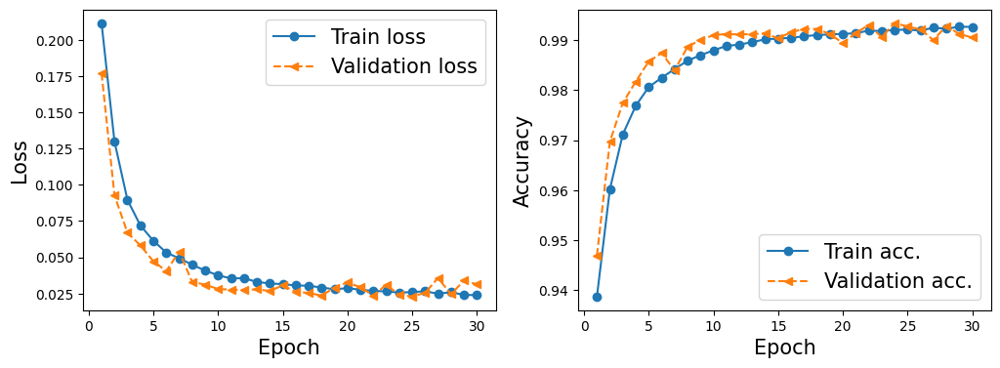

In [49]:
import numpy as np
x_arr = np.arange(len(hist[0])) + 1

fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(1, 2, 1)
ax.plot(x_arr, hist[0], '-o', label='Train loss')
ax.plot(x_arr, hist[1], '--<', label='Validation loss')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Loss', size=15)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x_arr, hist[2], '-o', label='Train acc.')
ax.plot(x_arr, hist[3], '--<', label='Validation acc.')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Accuracy', size=15)

#plt.savefig('figures/14_17.png', dpi=300)
plt.show()

### Plot of 10 random images

In [43]:
import matplotlib.pyplot as plt

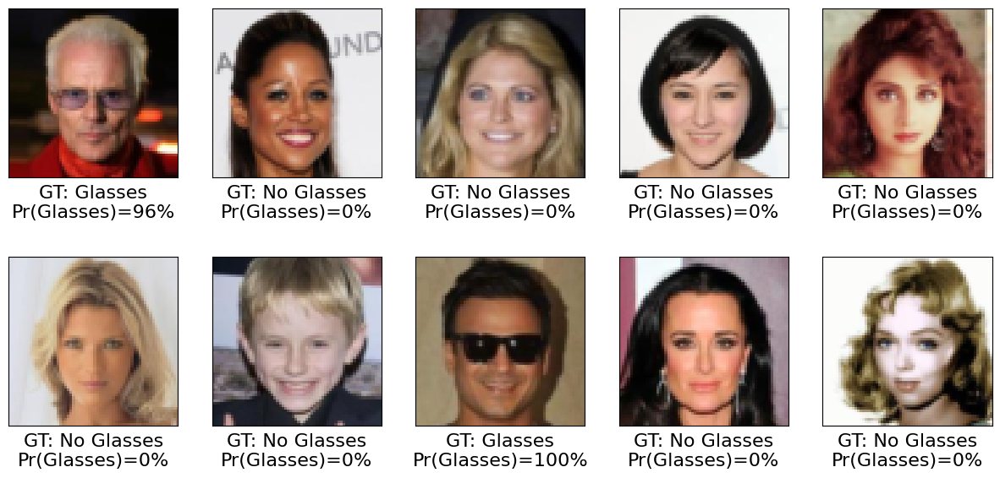

In [46]:
pred = model(x_batch)[:, 0] * 100

fig = plt.figure(figsize=(15, 7))
for j in range(16, 26):
    ax = fig.add_subplot(2, 5, j-16+1)
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(x_batch[j].cpu().permute(1, 2, 0))
    if y_batch[j] == 1:
        label = 'Glasses'
    else:
        label = 'No Glasses'
    ax.text(
        0.5, -0.15, 
        f'GT: {label:s}\nPr(Glasses)={pred[j]:.0f}%', 
        size=16, 
        horizontalalignment='center',
        verticalalignment='center', 
        transform=ax.transAxes)
    
#plt.savefig('figures/figures-14_18.png', dpi=300)
plt.show()